# Imports

In [1]:
#OS Import
#import os

# data Analysis and EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import ptitprince
#from IPython.display import display

# data exploration
import missingno as msno

# Machine Learning
## Feature Scaling
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mutual_info_score

## ML Model Algorithms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

## Metrics
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix

## Comparision of Performance of all Algorithms
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

# Export Model
import joblib

# this is not needed I just don't like the warnings
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")

# set seaborn as default style
sns.set()

In [2]:
path = 'customer_data_edited.csv'

In [3]:
df = pd.read_csv(path)
df.head()

,recordID,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,customer_id
0,1,HI,101,510,no,no,0,70.9,123,12.05,...,18.01,236.0,73,10.62,10.6,3,2.86,3,no,23383607.0
1,2,MT,137,510,no,no,0,223.6,86,38.01,...,20.81,94.2,81,4.24,9.5,7,2.57,0,no,22550362.0
2,3,OH,103,408,no,yes,29,294.7,95,50.10,...,20.17,300.3,127,13.51,13.7,6,3.70,1,no,59063354.0
3,4,NM,99,415,no,no,0,216.8,123,36.86,...,10.74,220.6,82,9.93,15.7,2,4.24,1,no,25464504.0
4,5,SC,108,415,no,no,0,197.4,78,33.56,...,10.54,204.5,107,9.20,7.7,4,2.08,2,no,691824.0


In [4]:
df_features = df.copy()

In [5]:
# reorder the columns and drop the index column
df = df.reindex(columns=['recordID', 'customer_id', 'state', 'account_length', 'area_code', 'international_plan',
        'voice_mail_plan', 'number_vmail_messages','total_day_minutes', 'total_day_calls', 'total_day_charge',
        'total_eve_minutes', 'total_eve_calls', 'total_eve_charge', 'total_night_minutes', 'total_night_calls',
        'total_night_charge','total_intl_minutes', 'total_intl_calls', 'total_intl_charge','number_customer_service_calls',
        'churn' ])
df.drop(['recordID'], axis=1, inplace = True)

In [6]:
## Transforming and encoding the columns
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns # array of column names to encode

    def fit(self,X,y=None):
        return self # not relevant here

    def transform(self,X):
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [7]:
df = MultiColumnLabelEncoder(columns = ['international_plan','voice_mail_plan', 'churn']).fit_transform(df)

In [8]:
#checking unique values in different variables
unique_values = {}
for col in df.columns:
    unique_values[col] = df[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=['unique value count']).transpose()

,unique value count
customer_id,12892
state,51
account_length,218
area_code,3
international_plan,2
voice_mail_plan,2
number_vmail_messages,48
total_day_minutes,1961
total_day_calls,123
total_day_charge,1961


# INFO

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12892 entries, 0 to 12891
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_id                    12892 non-null  float64
 1   state                          12892 non-null  object 
 2   account_length                 12892 non-null  int64  
 3   area_code                      12892 non-null  int64  
 4   international_plan             12892 non-null  int32  
 5   voice_mail_plan                12892 non-null  int32  
 6   number_vmail_messages          12892 non-null  int64  
 7   total_day_minutes              12892 non-null  float64
 8   total_day_calls                12892 non-null  int64  
 9   total_day_charge               12892 non-null  float64
 10  total_eve_minutes              12892 non-null  float64
 11  total_eve_calls                12892 non-null  int64  
 12  total_eve_charge               12892 non-null 

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_id,12892.0,2.830245e+11,3.205835e+13,34.0,24099086.00,3.219535e+07,55353187.50,3.640000e+15
account_length,12892.0,1.006766e+02,3.980641e+01,1.0,73.00,1.000000e+02,127.00,2.430000e+02
area_code,12892.0,4.371338e+02,4.234182e+01,408.0,408.00,4.150000e+02,510.00,5.100000e+02
international_plan,12892.0,9.626125e-02,2.949606e-01,0.0,0.00,0.000000e+00,0.00,1.000000e+00
voice_mail_plan,12892.0,2.730375e-01,4.455372e-01,0.0,0.00,0.000000e+00,1.00,1.000000e+00
number_vmail_messages,12892.0,7.996665e+00,1.364198e+01,0.0,0.00,0.000000e+00,19.00,5.200000e+01
total_day_minutes,12892.0,1.801620e+02,5.420706e+01,0.0,144.00,1.800000e+02,216.30,3.515000e+02
total_day_calls,12892.0,1.002666e+02,1.994666e+01,0.0,87.00,1.010000e+02,114.00,1.650000e+02
total_day_charge,12892.0,3.062809e+01,9.215171e+00,0.0,24.48,3.060000e+01,36.77,5.976000e+01
total_eve_minutes,12892.0,2.007119e+02,5.078185e+01,0.0,166.20,2.011500e+02,234.90,3.637000e+02


# Customer Analysis

array([[<AxesSubplot:title={'center':'customer_id'}>,
        <AxesSubplot:title={'center':'account_length'}>,
        <AxesSubplot:title={'center':'area_code'}>,
        <AxesSubplot:title={'center':'international_plan'}>],
       [<AxesSubplot:title={'center':'voice_mail_plan'}>,
        <AxesSubplot:title={'center':'number_vmail_messages'}>,
        <AxesSubplot:title={'center':'total_day_minutes'}>,
        <AxesSubplot:title={'center':'total_day_calls'}>],
       [<AxesSubplot:title={'center':'total_day_charge'}>,
        <AxesSubplot:title={'center':'total_eve_minutes'}>,
        <AxesSubplot:title={'center':'total_eve_calls'}>,
        <AxesSubplot:title={'center':'total_eve_charge'}>],
       [<AxesSubplot:title={'center':'total_night_minutes'}>,
        <AxesSubplot:title={'center':'total_night_calls'}>,
        <AxesSubplot:title={'center':'total_night_charge'}>,
        <AxesSubplot:title={'center':'total_intl_minutes'}>],
       [<AxesSubplot:title={'center':'total_intl_cal

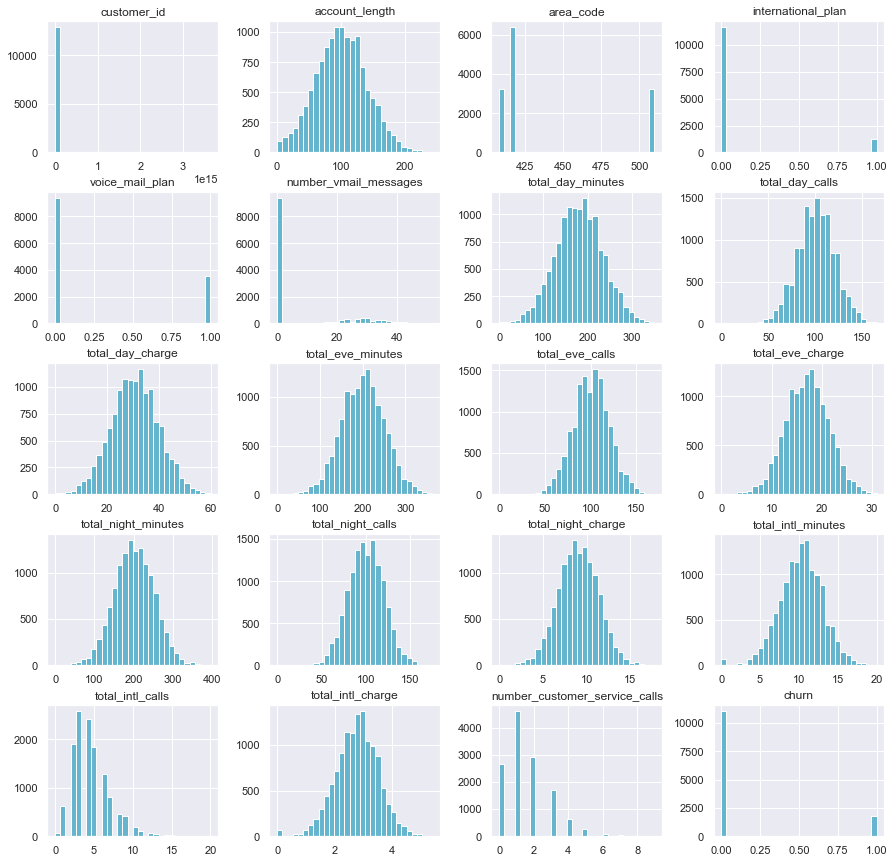

In [11]:
df.hist(figsize=(15,15), bins=30, color='c')
plt.show()

In [12]:
df.head().T

,0,1,2,3,4
customer_id,23383607.0,22550362.0,59063354.0,25464504.0,691824.0
state,HI,MT,OH,NM,SC
account_length,101,137,103,99,108
area_code,510,510,408,415,415
international_plan,0,0,0,0,0
voice_mail_plan,0,0,1,0,0
number_vmail_messages,0,0,29,0,0
total_day_minutes,70.9,223.6,294.7,216.8,197.4
total_day_calls,123,86,95,123,78
total_day_charge,12.05,38.01,50.1,36.86,33.56


The total Number of missing Value is 0


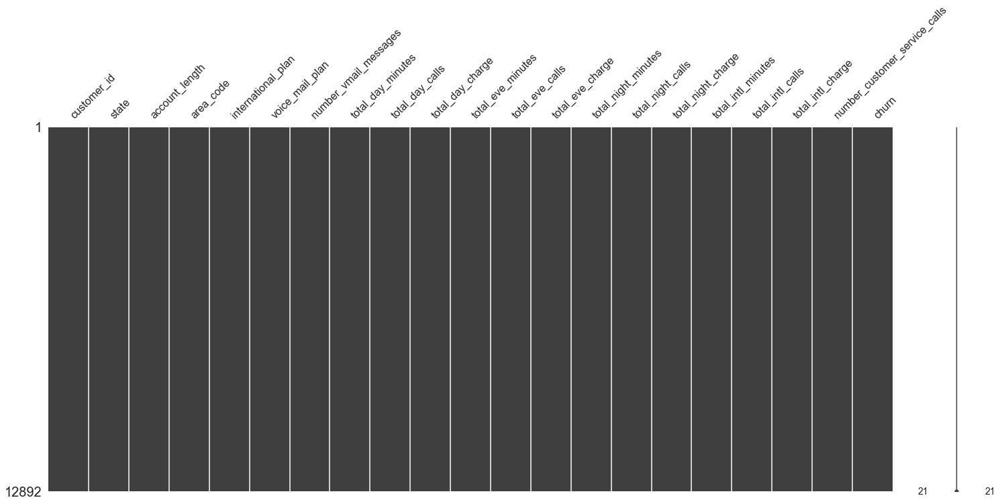

In [13]:
msno.matrix(df)
print("The total Number of missing Value is %d" % df.isnull().sum().sum())

<AxesSubplot:title={'center':'Percentage of Churned Ratio'}, ylabel='churn'>

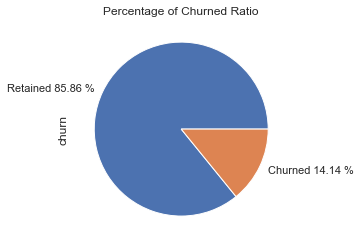

In [14]:
df["churn"].value_counts().plot(kind="pie", title="Percentage of Churned Ratio",
                                labels = ["Retained {:.2f} %".format(len(df.loc[df.churn==0])*100/len(df.churn)),
                                          "Churned {:.2f} %".format(len(df.loc[df.churn==1])*100/len(df.churn))],
                                figsize=(4,4))

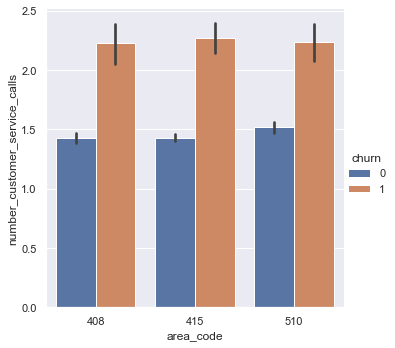

In [15]:
sns.catplot( x="area_code", y="number_customer_service_calls", hue="churn", kind="bar", data=df)

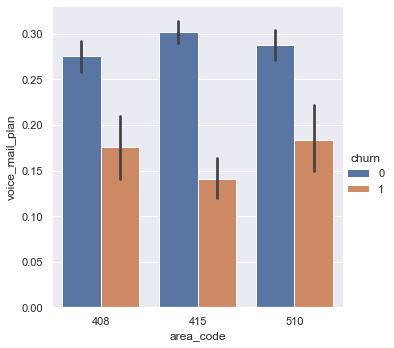

In [16]:
sns.catplot(x="area_code", y="voice_mail_plan", hue="churn", kind='bar', data=df)

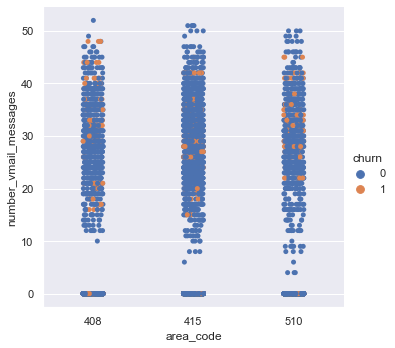

In [17]:
sns.catplot(x="area_code", y="number_vmail_messages", hue="churn", data=df)

In [18]:
df1 = df.loc[df["churn"]==1] # Churned Customers
df0 = df.loc[df["churn"]==0] # Existing Customers

**In the Customer Account Lenght case also we can easily consider two segments.
Consider the segment as below,**
1. Customers whose account lenght is less than 109 days.
2. Customers whose account lenght is greater than 109 days.

# Customer Segmentation

In [19]:
# Manual Customer Segmentaion
seg1 = df.loc[df["account_length"]<=109] # Segment1
seg2 = df.loc[df["account_length"]>109] # Segment2

seg11 = seg1.loc[seg1["churn"]==1] # Churn Customers from Segment1
seg10 = seg1.loc[seg1["churn"]==0] # Existing Custoemrs from Segment1

seg21 = seg2.loc[seg2["churn"]==1] # Churned Custoemrs in segment2.
seg20 = seg2.loc[seg2["churn"]==0] # Existing Custoemrs in segment2.

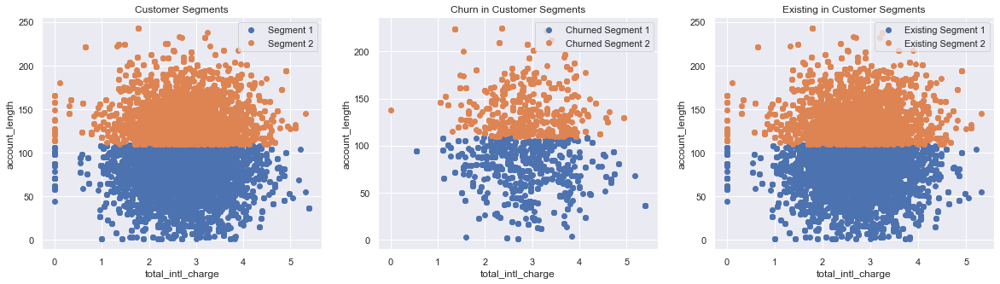

In [20]:
plt.figure(figsize=(20,5))

plt.subplot(131)
plt.plot(seg1['total_intl_charge'], seg1['account_length'], 'o', label='Segment 1')
plt.plot(seg2['total_intl_charge'], seg2['account_length'], 'o', label='Segment 2')
plt.title('Customer Segments')
plt.xlabel('total_intl_charge')
plt.ylabel("account_length")
plt.legend()

plt.subplot(132)
plt.plot(seg11['total_intl_charge'], seg11['account_length'], 'o', label='Churned Segment 1')
plt.plot(seg21['total_intl_charge'], seg21['account_length'], 'o', label='Churned Segment 2')
plt.title('Churn in Customer Segments')
plt.xlabel('total_intl_charge')
plt.ylabel("account_length")
plt.legend()

plt.subplot(133)
plt.plot(seg10['total_intl_charge'], seg10['account_length'], 'o', label='Existing Segment 1')
plt.plot(seg20['total_intl_charge'], seg20['account_length'], 'o', label='Existing Segment 2')
plt.title('Existing in Customer Segments')
plt.xlabel('total_intl_charge')
plt.ylabel("account_length")
plt.legend()

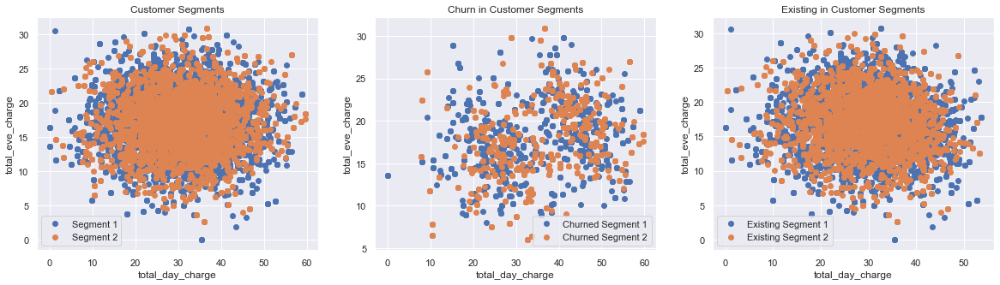

In [21]:
plt.figure(figsize=(20,5))

plt.subplot(131)
plt.plot(seg1['total_day_charge'], seg1['total_eve_charge'], 'o', label='Segment 1')
plt.plot(seg2['total_day_charge'], seg2['total_eve_charge'], 'o', label='Segment 2')
plt.title('Customer Segments')
plt.xlabel('total_day_charge')
plt.ylabel("total_eve_charge")
plt.legend()

plt.subplot(132)
plt.plot(seg11['total_day_charge'], seg11['total_eve_charge'], 'o', label='Churned Segment 1')
plt.plot(seg21['total_day_charge'], seg21['total_eve_charge'], 'o', label='Churned Segment 2')
plt.title('Churn in Customer Segments')
plt.xlabel('total_day_charge')
plt.ylabel("total_eve_charge")
plt.legend()

plt.subplot(133)
plt.plot(seg10['total_day_charge'], seg10['total_eve_charge'], 'o', label='Existing Segment 1')
plt.plot(seg20['total_day_charge'], seg20['total_eve_charge'], 'o', label='Existing Segment 2')
plt.title('Existing in Customer Segments')
plt.xlabel('total_day_charge')
plt.ylabel("total_eve_charge")
plt.legend()

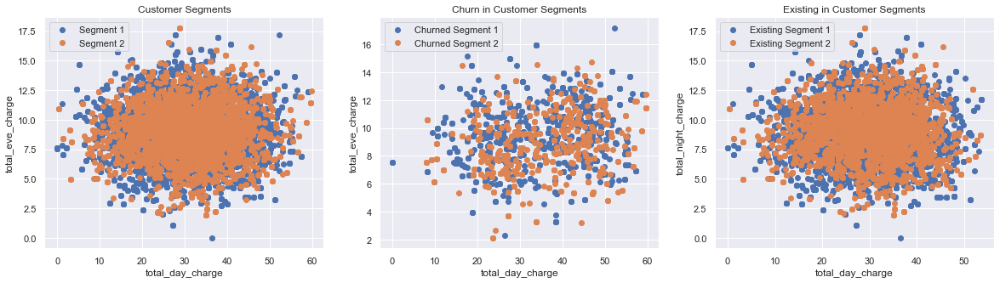

In [22]:
plt.figure(figsize=(20,5))

plt.subplot(131)
plt.plot(seg1['total_day_charge'], seg1['total_night_charge'], 'o', label='Segment 1')
plt.plot(seg2['total_day_charge'], seg2['total_night_charge'], 'o', label='Segment 2')
plt.title('Customer Segments')
plt.xlabel('total_day_charge')
plt.ylabel("total_eve_charge")
plt.legend()

plt.subplot(132)
plt.plot(seg11['total_day_charge'], seg11['total_night_charge'], 'o', label='Churned Segment 1')
plt.plot(seg21['total_day_charge'], seg21['total_night_charge'], 'o', label='Churned Segment 2')
plt.title('Churn in Customer Segments')
plt.xlabel('total_day_charge')
plt.ylabel("total_eve_charge")
plt.legend()

plt.subplot(133)
plt.plot(seg10['total_day_charge'], seg10['total_night_charge'], 'o', label='Existing Segment 1')
plt.plot(seg20['total_day_charge'], seg20['total_night_charge'], 'o', label='Existing Segment 2')
plt.title('Existing in Customer Segments')
plt.xlabel('total_day_charge')
plt.ylabel("total_night_charge")
plt.legend()

### Segment 1. Customers who's  account lenght is less than 109 days.

In [23]:
seg1.head()

,customer_id,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,23383607.0,HI,101,510,0,0,0,70.9,123,12.05,...,73,18.01,236.0,73,10.62,10.6,3,2.86,3,0
2,59063354.0,OH,103,408,0,1,29,294.7,95,50.10,...,105,20.17,300.3,127,13.51,13.7,6,3.70,1,0
3,25464504.0,NM,99,415,0,0,0,216.8,123,36.86,...,88,10.74,220.6,82,9.93,15.7,2,4.24,1,0
4,691824.0,SC,108,415,0,0,0,197.4,78,33.56,...,101,10.54,204.5,107,9.20,7.7,4,2.08,2,0
6,29694916.0,ND,63,415,0,1,32,218.9,124,37.21,...,125,18.22,260.3,120,11.71,12.9,3,3.48,1,0


In [24]:
# % of customer churn in seg1 
seg1["churn"].value_counts(normalize=True) * 100

0    86.260344
1    13.739656
Name: churn, dtype: float64

In [25]:
# % of customer having data plan in seg1 
(seg1["voice_mail_plan"].value_counts(normalize=True) * 100)

0    72.980428
1    27.019572
Name: voice_mail_plan, dtype: float64

In [26]:
# list of customer having data plan in seg1, 2057 customers
seg1.loc[seg1["voice_mail_plan"]==1]

,customer_id,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
2,59063354.0,OH,103,408,0,1,29,294.7,95,50.10,...,105,20.17,300.3,127,13.51,13.7,6,3.70,1,0
6,29694916.0,ND,63,415,0,1,32,218.9,124,37.21,...,125,18.22,260.3,120,11.71,12.9,3,3.48,1,0
18,31674732.0,NC,106,415,0,1,25,169.4,105,28.80,...,108,20.44,159.4,114,7.17,13.9,5,3.75,4,0
22,25548363.0,TN,92,510,0,1,25,79.8,99,13.57,...,120,26.66,135.5,104,6.10,9.3,8,2.51,2,0
23,624320.0,DE,42,415,0,1,31,170.8,101,29.04,...,104,19.84,174.2,121,7.84,11.0,3,2.97,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12866,27723816.0,VT,100,415,0,1,25,215.9,90,36.70,...,92,21.92,180.2,157,8.11,11.6,4,3.13,1,0
12872,33821489.0,IA,92,510,0,1,25,134.0,112,22.78,...,111,17.51,180.6,118,8.13,9.7,4,2.62,0,0
12873,51570232.0,WA,13,510,0,1,25,176.6,65,30.02,...,96,14.68,104.5,128,4.70,11.3,5,3.05,2,0
12883,58651613.0,ME,80,408,0,1,31,166.4,92,28.29,...,74,20.26,150.7,84,6.78,10.7,4,2.89,4,0


Text(0.5, 1.0, 'Churn=0&1')

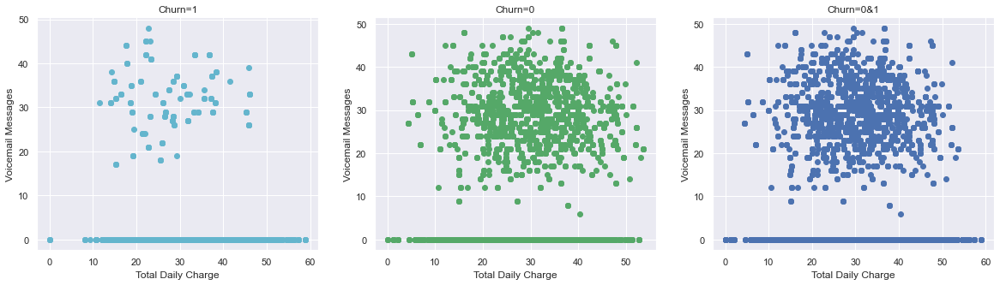

In [27]:
plt.figure(figsize=(20,5))

plt.subplot(131)
plt.plot(seg11["total_day_charge"], seg11["number_vmail_messages"], "co")
plt.xlabel("Total Daily Charge")
plt.ylabel("Voicemail Messages")
plt.title("Churn=1")

plt.subplot(132)
plt.plot(seg10["total_day_charge"], seg10["number_vmail_messages"], "go")
plt.xlabel("Total Daily Charge")
plt.ylabel("Voicemail Messages")
plt.title("Churn=0")

plt.subplot(133)
plt.plot(seg1["total_day_charge"], seg1["number_vmail_messages"], "o")
plt.xlabel("Total Daily Charge")
plt.ylabel("Voicemail Messages")
plt.title("Churn=0&1")

Text(0.5, 1.0, 'Churn=0&1')

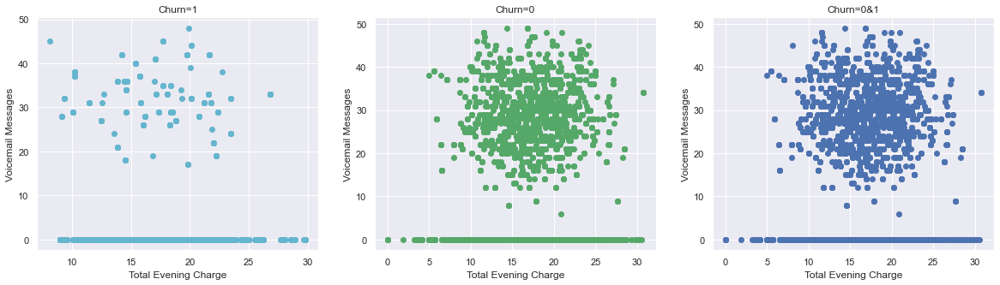

In [28]:
plt.figure(figsize=(20,5))

plt.subplot(131)
plt.plot(seg11["total_eve_charge"], seg11["number_vmail_messages"], "co")
plt.xlabel("Total Evening Charge")
plt.ylabel("Voicemail Messages")
plt.title("Churn=1")

plt.subplot(132)
plt.plot(seg10["total_eve_charge"], seg10["number_vmail_messages"], "go")
plt.xlabel("Total Evening Charge")
plt.ylabel("Voicemail Messages")
plt.title("Churn=0")

plt.subplot(133)
plt.plot(seg1["total_eve_charge"], seg1["number_vmail_messages"], "o")
plt.xlabel("Total Evening Charge")
plt.ylabel("Voicemail Messages")
plt.title("Churn=0&1")

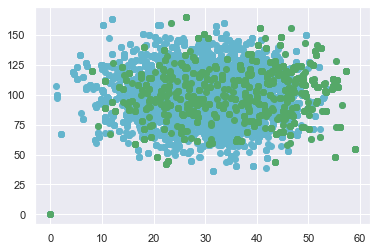

In [29]:
plt.plot(seg1["total_day_charge"], seg1["total_day_calls"], "co") # All within seg1
plt.plot(seg11["total_day_charge"], seg11["total_day_calls"], "go") # Churned within seg1

### More on customer calls

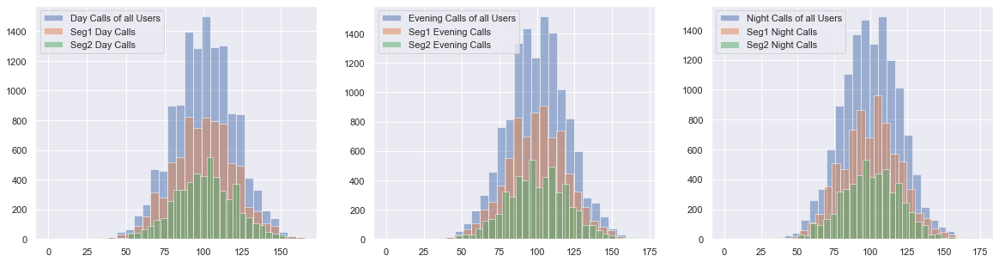

In [30]:
plt.figure(figsize=(20,5))

plt.subplot(131)
df["total_day_calls"].hist(bins=30, alpha=0.5, label='Day Calls of all Users')
seg1["total_day_calls"].hist(bins=30, alpha=0.5, label='Seg1 Day Calls')
seg2["total_day_calls"].hist(bins=30, alpha=0.5, label='Seg2 Day Calls')
plt.legend()

plt.subplot(132)
df["total_eve_calls"].hist(bins=30, alpha=0.5, label='Evening Calls of all Users')
seg1["total_eve_calls"].hist(bins=30, alpha=0.5, label='Seg1 Evening Calls')
seg2["total_eve_calls"].hist(bins=30, alpha=0.5, label='Seg2 Evening Calls')
plt.legend()

plt.subplot(133)
df["total_night_calls"].hist(bins=30, alpha=0.5, label='Night Calls of all Users')
seg1["total_night_calls"].hist(bins=30, alpha=0.5, label='Seg1 Night Calls')
seg2["total_night_calls"].hist(bins=30, alpha=0.5, label='Seg2 Night Calls')
plt.legend()

### Segment 2. Customers who's account lenght is greater than 109 days.

In [31]:
seg2.head()

,customer_id,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,22550362.0,MT,137,510,0,0,0,223.6,86,38.01,...,139,20.81,94.2,81,4.24,9.5,7,2.57,0,0
5,24456543.0,IA,117,415,0,0,0,226.5,85,38.51,...,68,12.04,223.0,90,10.04,6.9,5,1.86,1,0
8,22612071.0,MO,138,510,0,0,0,89.1,117,15.15,...,46,10.78,190.5,71,8.57,9.9,4,2.67,2,0
9,12721031.0,TX,128,415,0,1,43,177.8,100,30.23,...,89,12.52,194.2,92,8.74,11.9,1,3.21,0,0
10,41876970.0,AR,113,510,0,1,39,209.8,77,35.67,...,90,13.95,159.7,100,7.19,9.0,4,2.43,1,0


In [32]:
# % Churn in seg2.
seg2["churn"].value_counts(normalize=True) * 100

0    85.281303
1    14.718697
Name: churn, dtype: float64

In [33]:
# Every custoemrs has data plan in seg2
seg2["voice_mail_plan"].value_counts()

0    3816
1    1463
Name: voice_mail_plan, dtype: int64

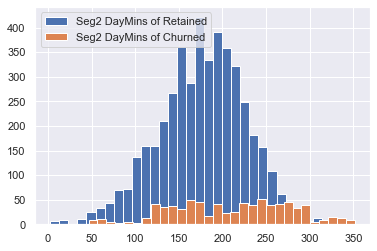

In [34]:
seg20["total_day_minutes"].hist(bins=30, label='Seg2 DayMins of Retained') 
seg21["total_day_minutes"].hist(bins=30, label='Seg2 DayMins of Churned') 
plt.legend()

### Segment 2 Total day charge on voice mail messages

Text(0.5, 1.0, 'Churn=0&1')

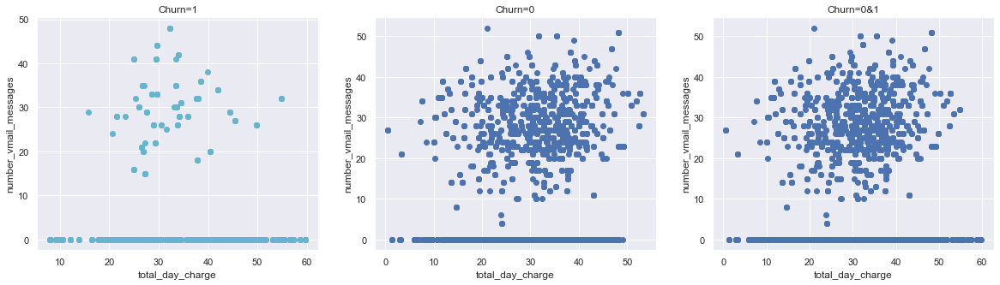

In [35]:
plt.figure(figsize=(20,5))

plt.subplot(131)
plt.plot(seg21["total_day_charge"], seg21["number_vmail_messages"], "co")
plt.xlabel("total_day_charge")
plt.ylabel("number_vmail_messages")
plt.title("Churn=1")

plt.subplot(132)
plt.plot(seg20["total_day_charge"], seg20["number_vmail_messages"], "o")
plt.xlabel("total_day_charge")
plt.ylabel("number_vmail_messages")
plt.title("Churn=0")

plt.subplot(133)
plt.plot(seg2["total_day_charge"], seg2["number_vmail_messages"], "o")
plt.xlabel("total_day_charge")
plt.ylabel("number_vmail_messages")
plt.title("Churn=0&1")

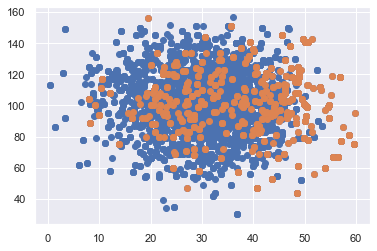

In [36]:
plt.plot(seg2["total_day_charge"], seg2["total_day_calls"], "o") # All within seg2
plt.plot(seg21["total_day_charge"], seg21["total_day_calls"], "o")# Churned within seg1

<function matplotlib.pyplot.show(close=None, block=None)>

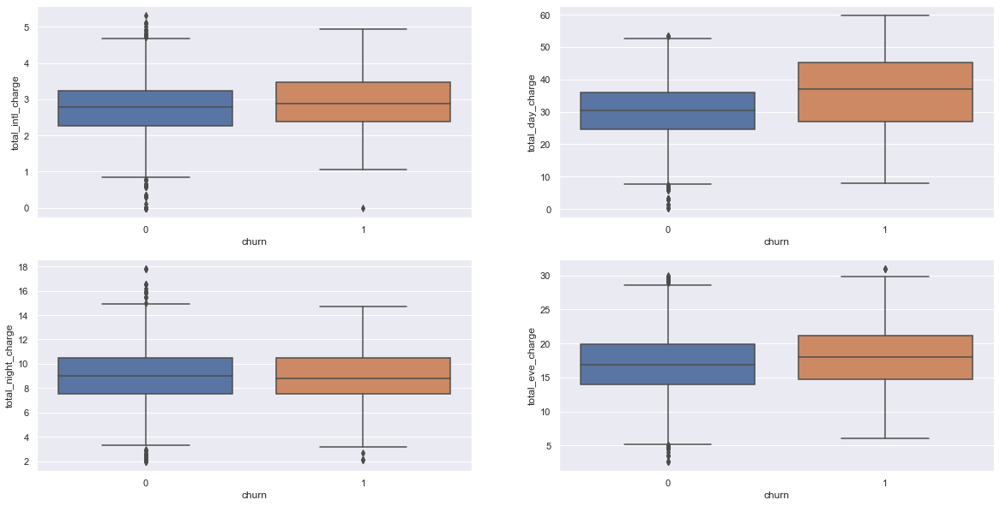

In [37]:
#plt.figure(figsize=(20,5))
fig, ax = plt.subplots(2, 2, figsize = (20,10))
sns.boxplot(ax = ax[0][0], x="churn", y="total_intl_charge", data=seg2)
sns.boxplot(ax = ax[0][1], x="churn", y="total_day_charge", data=seg2)
sns.boxplot(ax = ax[1][0], x="churn", y="total_night_charge", data=seg2)
sns.boxplot(ax = ax[1][1], x="churn", y="total_eve_charge", data=seg2)

plt.show

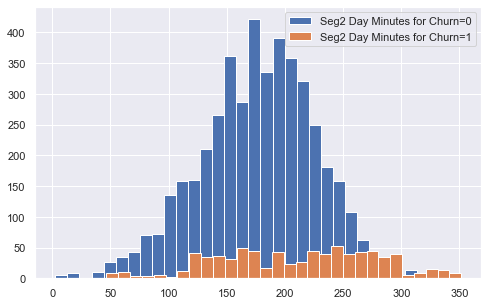

In [38]:
plt.figure(figsize=(8,5))

seg20["total_day_minutes"].hist(bins=30, label='Seg2 Day Minutes for Churn=0')
seg21["total_day_minutes"].hist(bins=30, label='Seg2 Day Minutes for Churn=1') 
plt.legend()

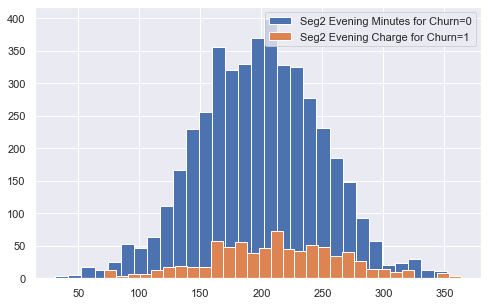

In [39]:
plt.figure(figsize=(8,5))
seg20["total_eve_minutes"].hist(bins=30, label='Seg2 Evening Minutes for Churn=0') 
seg21["total_eve_minutes"].hist(bins=30, label='Seg2 Evening Charge for Churn=1') 
plt.legend()

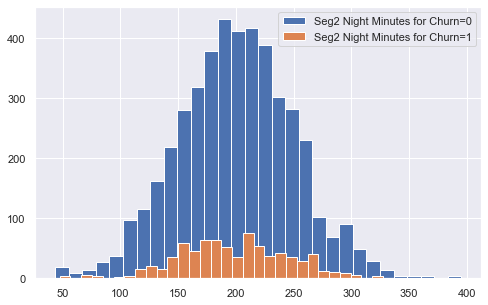

In [40]:
plt.figure(figsize=(8,5))
seg20["total_night_minutes"].hist(bins=30, label='Seg2 Night Minutes for Churn=0') 
seg21["total_night_minutes"].hist(bins=30, label='Seg2 Night Minutes for Churn=1')
plt.legend() 

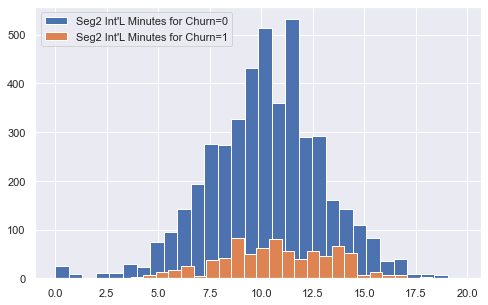

In [41]:
plt.figure(figsize=(8,5))
seg20["total_intl_minutes"].hist(bins=30, label="Seg2 Int'L Minutes for Churn=0") 
seg21["total_intl_minutes"].hist(bins=30, label="Seg2 Int'L Minutes for Churn=1")
plt.legend() 

## Seg 1 & Seg2 DayMins

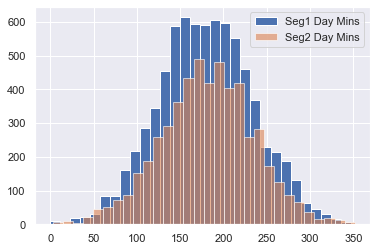

In [42]:
seg1['total_day_minutes'].hist(bins=30, label='Seg1 Day Mins')
seg2['total_day_minutes'].hist(bins=30, alpha=0.6, label='Seg2 Day Mins')
plt.legend()

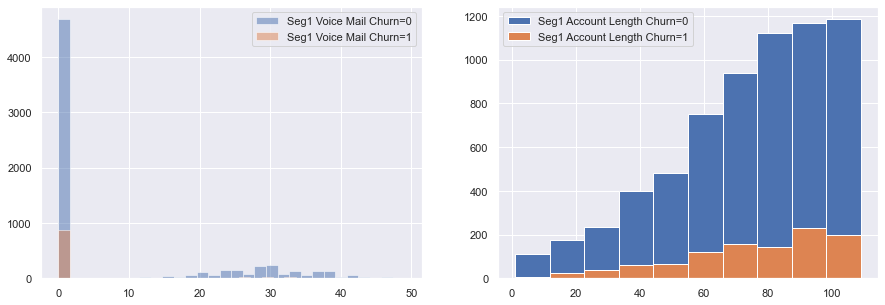

In [43]:
plt.figure(figsize=(15,5))

plt.subplot(121)
seg10["number_vmail_messages"].hist(bins=30, alpha=0.5, label='Seg1 Voice Mail Churn=0')
seg11["number_vmail_messages"].hist(bins=30, alpha=0.5, label='Seg1 Voice Mail Churn=1')
plt.legend()

plt.subplot(122)
seg10["account_length"].hist(label='Seg1 Account Length Churn=0')
seg11["account_length"].hist(label='Seg1 Account Length Churn=1')
plt.legend()

<function matplotlib.pyplot.show(close=None, block=None)>

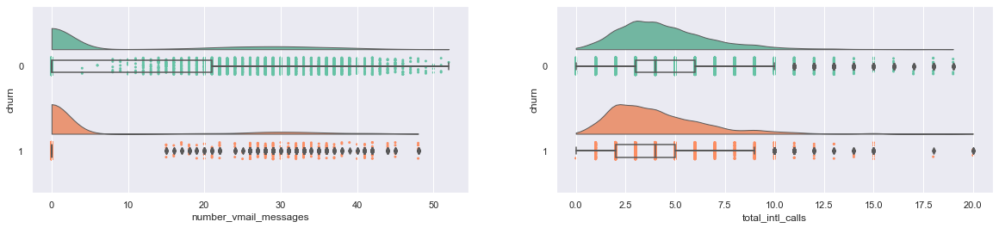

In [44]:
fig, ax =  plt.subplots(1,2, figsize=(20,4))
ptitprince.RainCloud(ax=ax[0], data = df, x = 'churn', y = 'number_vmail_messages', orient = 'h')
ptitprince.RainCloud(ax=ax[1], data = df, x = 'churn', y = 'total_intl_calls', orient = 'h')
plt.show

## Seg1 & Seg2 Monthly Charges

<function matplotlib.pyplot.show(close=None, block=None)>

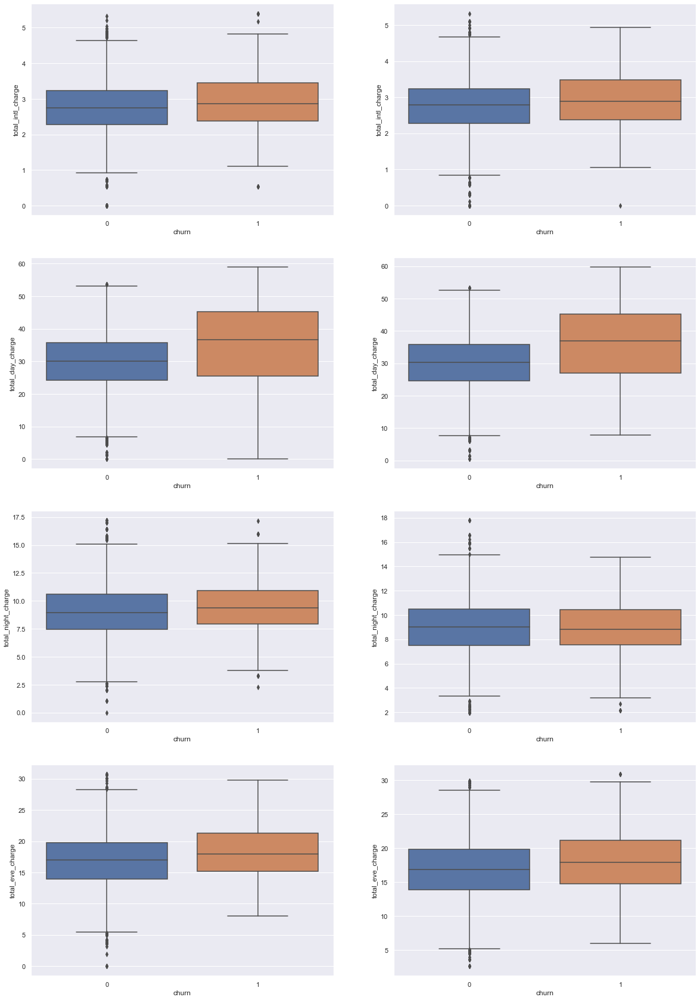

In [45]:
fig, ax = plt.subplots(4, 2, figsize = (20,30))
sns.boxplot(ax = ax[0][0], x="churn", y="total_intl_charge", data=seg1)
sns.boxplot(ax = ax[0][1], x="churn", y="total_intl_charge", data=seg2)
sns.boxplot(ax = ax[1][0], x="churn", y="total_day_charge", data=seg1)
sns.boxplot(ax = ax[1][1], x="churn", y="total_day_charge", data=seg2)
sns.boxplot(ax = ax[2][0], x="churn", y="total_night_charge", data=seg1)
sns.boxplot(ax = ax[2][1], x="churn", y="total_night_charge", data=seg2)
sns.boxplot(ax = ax[3][0], x="churn", y="total_eve_charge", data=seg1)
sns.boxplot(ax = ax[3][1], x="churn", y="total_eve_charge", data=seg2)

plt.show

### SUM of Monthly Charges seg1 & 2

## Roaming

## Customer Service Calls

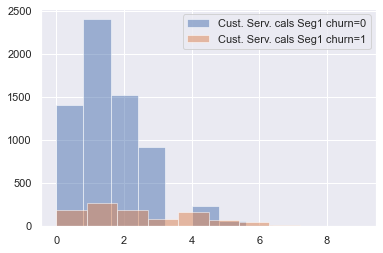

In [46]:
seg10["number_customer_service_calls"].hist(alpha=0.5, label='Cust. Serv. cals Seg1 churn=0')
seg11["number_customer_service_calls"].hist(alpha=0.5, label='Cust. Serv. cals Seg1 churn=1')
plt.legend()

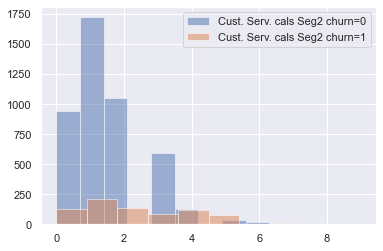

In [47]:
seg20["number_customer_service_calls"].hist(alpha=0.5, label='Cust. Serv. cals Seg2 churn=0')
seg21["number_customer_service_calls"].hist(alpha=0.5, label='Cust. Serv. cals Seg2 churn=1')
plt.legend()

## Plan Renewal

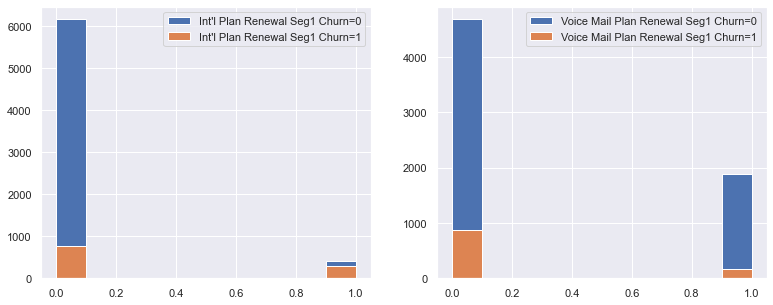

In [48]:
plt.figure(figsize=(13,5))
plt.subplot(121)
seg10["international_plan"].hist(label="Int'l Plan Renewal Seg1 Churn=0") 
seg11["international_plan"].hist(label="Int'l Plan Renewal Seg1 Churn=1")
plt.legend() 

plt.subplot(122)
seg10["voice_mail_plan"].hist(label="Voice Mail Plan Renewal Seg1 Churn=0") 
seg11["voice_mail_plan"].hist(label="Voice Mail Plan Renewal Seg1 Churn=1")
plt.legend() 
 

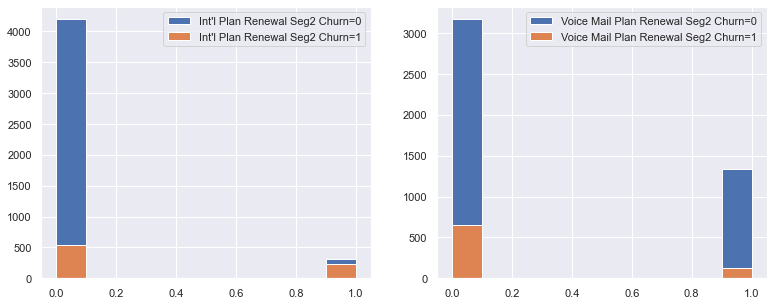

In [49]:
plt.figure(figsize=(13,5))
plt.subplot(121)
seg20["international_plan"].hist(label="Int'l Plan Renewal Seg2 Churn=0") 
seg21["international_plan"].hist(label="Int'l Plan Renewal Seg2 Churn=1")
plt.legend() 

plt.subplot(122)
seg20["voice_mail_plan"].hist(label="Voice Mail Plan Renewal Seg2 Churn=0") 
seg21["voice_mail_plan"].hist(label="Voice Mail Plan Renewal Seg2 Churn=1")
plt.legend() 


<function matplotlib.pyplot.show(close=None, block=None)>

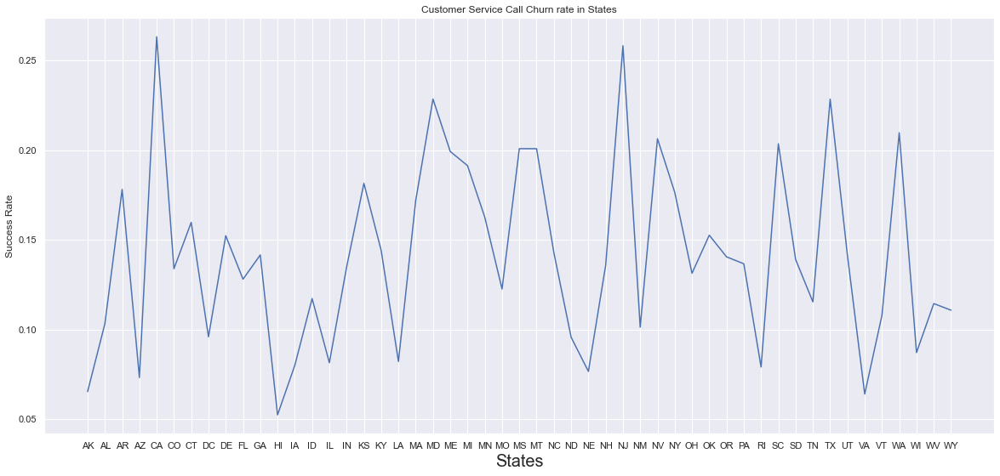

In [50]:
# Line chart of Churn success rate
df_groupby_state = df.groupby("state", as_index=False)["churn"].mean()
sns.set(rc={'figure.figsize':(20,9)})
sns.lineplot(data=df_groupby_state, x="state", y="churn")
plt.xlabel("States", fontsize=20)
plt.ylabel("Success Rate")
plt.title("Customer Service Call Churn rate in States")
plt.show

## Steps to Retain Customers
* More Customer Service calls mean the customer is more likely to be retained.
* More attention is require in states like CA, MD, NU, and TX to manage the rapid churn rate of customers.
* Optimise price of talk time for segment 1 customers.
* Introduce data plan to those customers who are using data without data plans ASAP.
* Introduce exciting data plans to segment 1 customers.
* If possible optimising price of data plans can retain segment 2 customers also.

# Machine Learning Model

## Random Under-Sampling

In [51]:
#Imbalanced dataset
df['churn'].value_counts()

0    11069
1     1823
Name: churn, dtype: int64

In [52]:
# Random under-sampling
df2 = df.loc[df['churn']==0].sample(n=1823).copy()

# All Churned Customers
df3 = df.loc[df['churn']==1].copy()

# Concat all customers, with new index on raws
df_sample = pd.concat([df2,df3], ignore_index=True)

# Shuffle raws randomly
df_sample = df_sample.sample(frac=1)

# Reset index of every raws
df_sample.reset_index(drop=True, inplace=True)
#print(df_sample['state'].unique())

## EDA

In [53]:
df_sample.head()

,customer_id,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,59125302.0,KS,126,408,0,0,0,321.3,99,54.62,...,93,14.27,193.6,106,8.71,8.0,4,2.16,1,1
1,1546423.0,GA,89,415,0,0,0,213.0,63,36.21,...,71,15.01,262.6,126,11.82,9.1,1,2.46,1,1
2,33649823.0,DE,115,415,0,0,0,195.9,111,33.30,...,108,19.30,313.2,113,14.09,13.2,1,3.56,2,0
3,58022245.0,MI,158,415,0,0,0,195.9,103,33.30,...,95,7.57,302.2,82,13.60,10.3,3,2.78,1,0
4,57130668.0,NM,81,415,0,0,0,173.2,80,29.44,...,94,20.08,240.2,84,10.81,11.8,6,3.19,2,0


<AxesSubplot:>

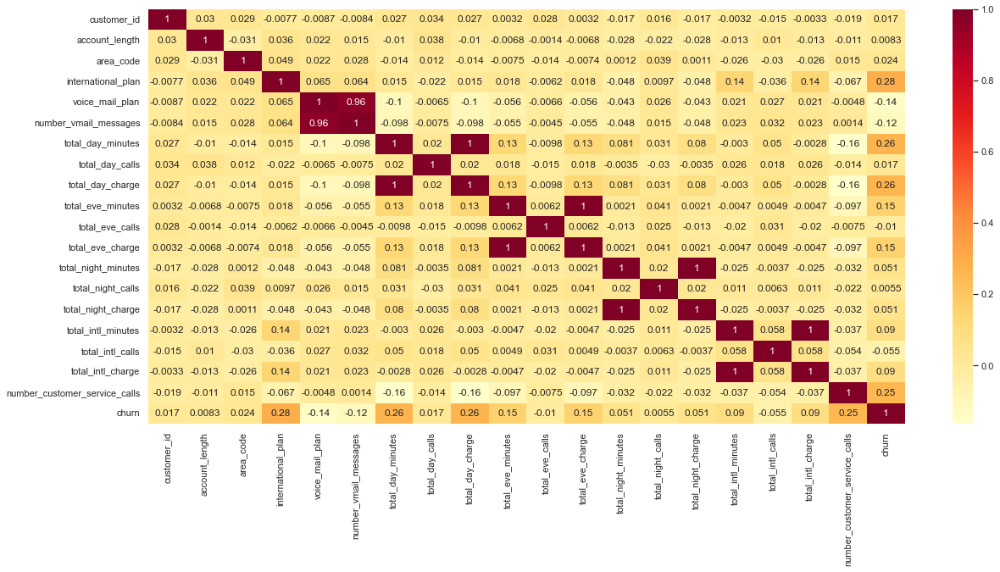

In [54]:
sns.heatmap(df_sample.corr(), annot=True, cmap='YlOrRd')

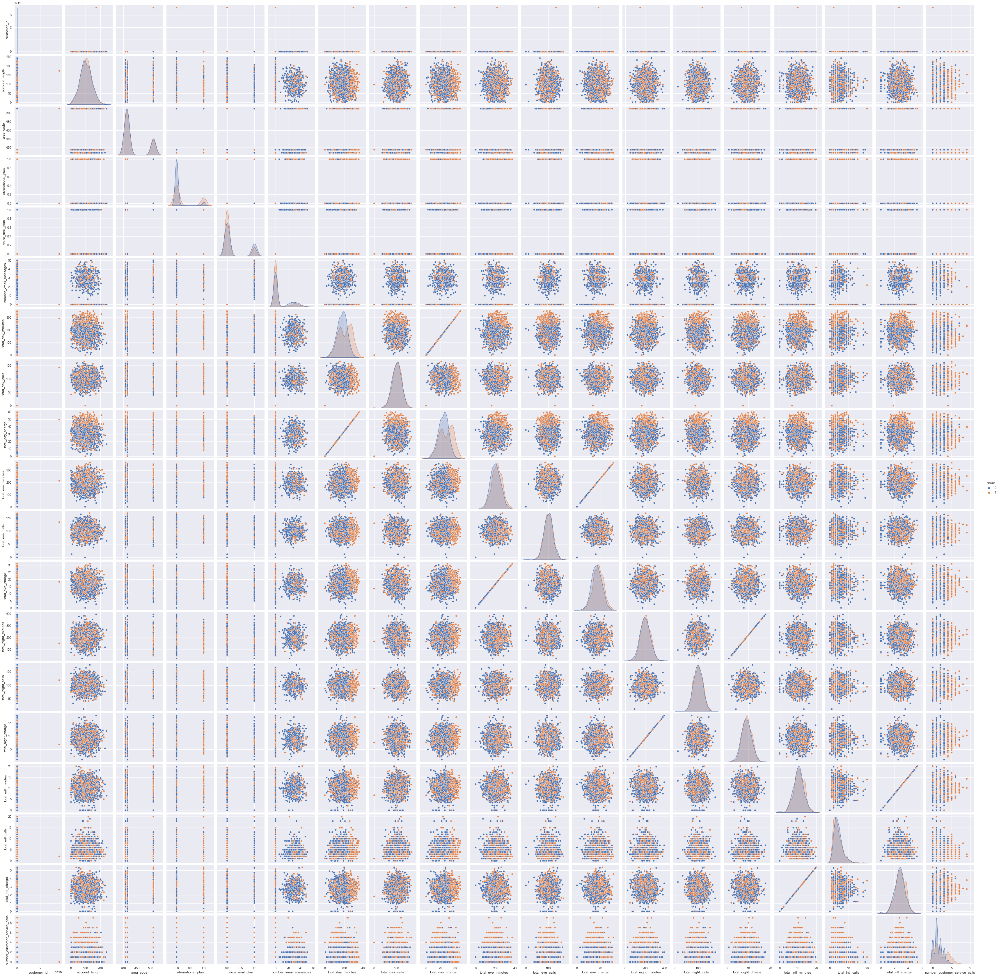

In [55]:
sns.pairplot(df_sample, hue='churn')

<function matplotlib.pyplot.show(close=None, block=None)>

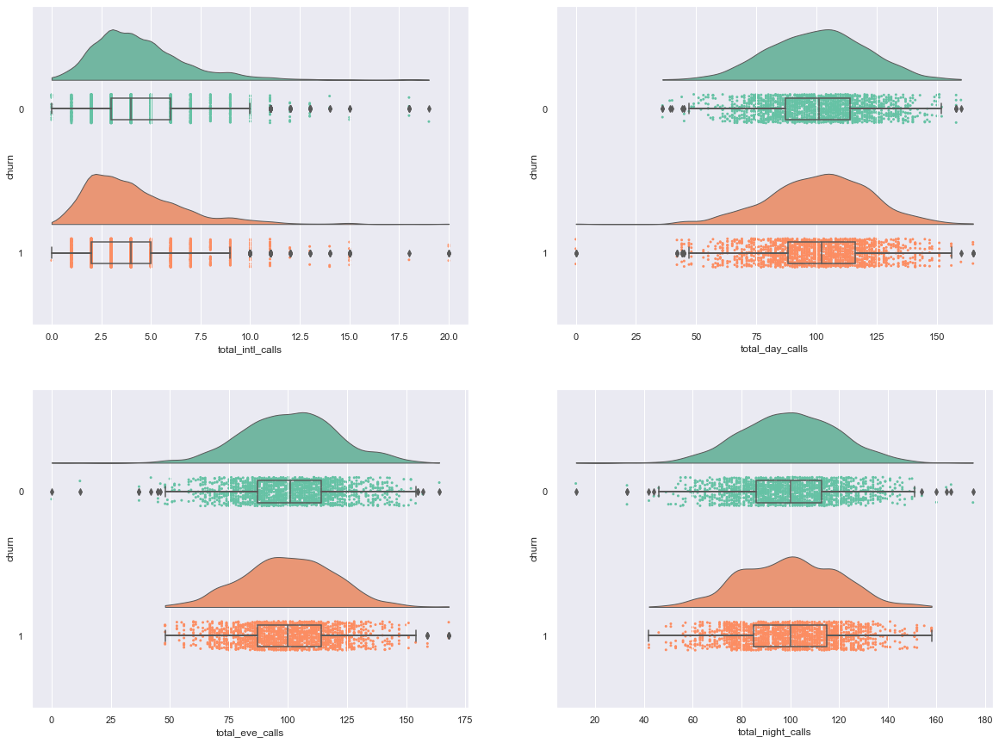

In [56]:
fig, ax =  plt.subplots(2,2, figsize=(20,15))
ptitprince.RainCloud(ax=ax[0][0], data = df_sample, x = 'churn', y = 'total_intl_calls', orient = 'h')
ptitprince.RainCloud(ax=ax[0][1], data = df_sample, x = 'churn', y = 'total_day_calls', orient = 'h')
ptitprince.RainCloud(ax=ax[1][0], data = df_sample, x = 'churn', y = 'total_eve_calls', orient = 'h')
ptitprince.RainCloud(ax=ax[1][1], data = df_sample, x = 'churn', y = 'total_night_calls', orient = 'h')

plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

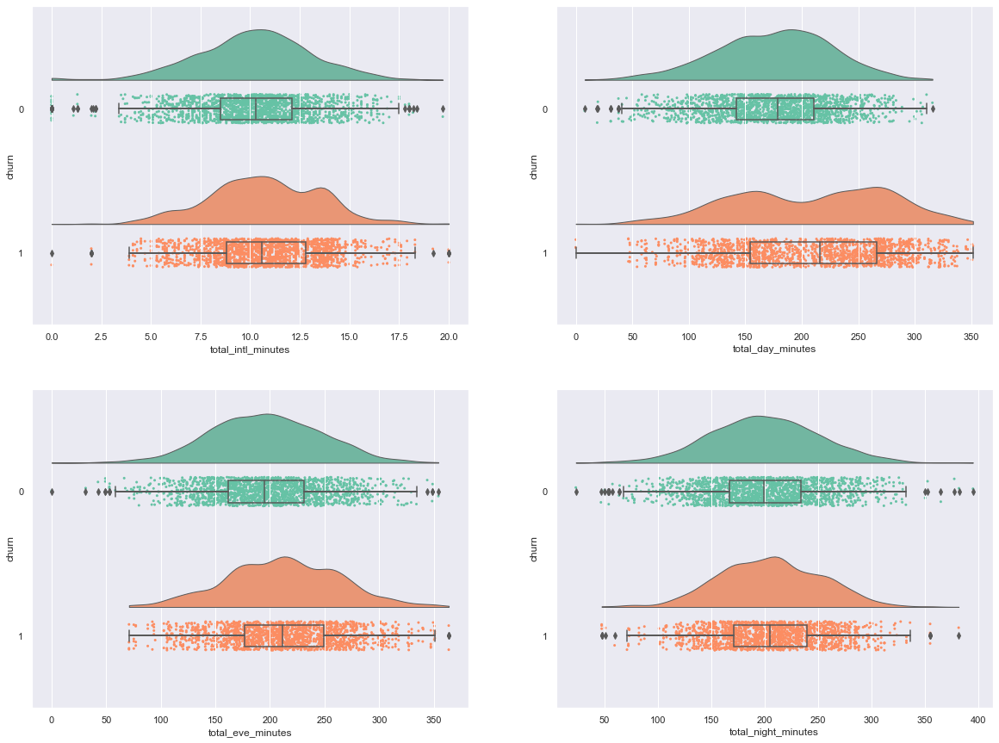

In [57]:
fig, ax =  plt.subplots(2,2, figsize=(20,15))
ptitprince.RainCloud(ax=ax[0][0], data = df_sample, x = 'churn', y = 'total_intl_minutes', orient = 'h')
ptitprince.RainCloud(ax=ax[0][1], data = df_sample, x = 'churn', y = 'total_day_minutes', orient = 'h')
ptitprince.RainCloud(ax=ax[1][0], data = df_sample, x = 'churn', y = 'total_eve_minutes', orient = 'h')
ptitprince.RainCloud(ax=ax[1][1], data = df_sample, x = 'churn', y = 'total_night_minutes', orient = 'h')

plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

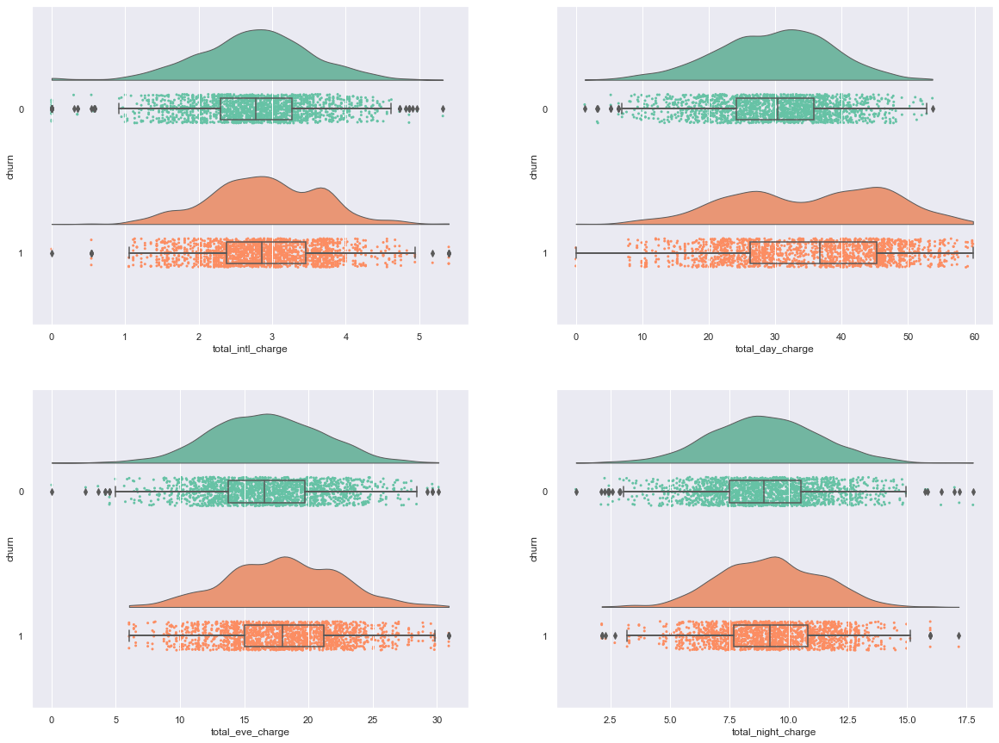

In [58]:
fig, ax =  plt.subplots(2,2, figsize=(20,15))
ptitprince.RainCloud(ax=ax[0][0], data = df_sample, x = 'churn', y = 'total_intl_charge', orient = 'h')
ptitprince.RainCloud(ax=ax[0][1], data = df_sample, x = 'churn', y = 'total_day_charge', orient = 'h')
ptitprince.RainCloud(ax=ax[1][0], data = df_sample, x = 'churn', y = 'total_eve_charge', orient = 'h')
ptitprince.RainCloud(ax=ax[1][1], data = df_sample, x = 'churn', y = 'total_night_charge', orient = 'h')

plt.show

<AxesSubplot:xlabel='number_vmail_messages', ylabel='churn'>

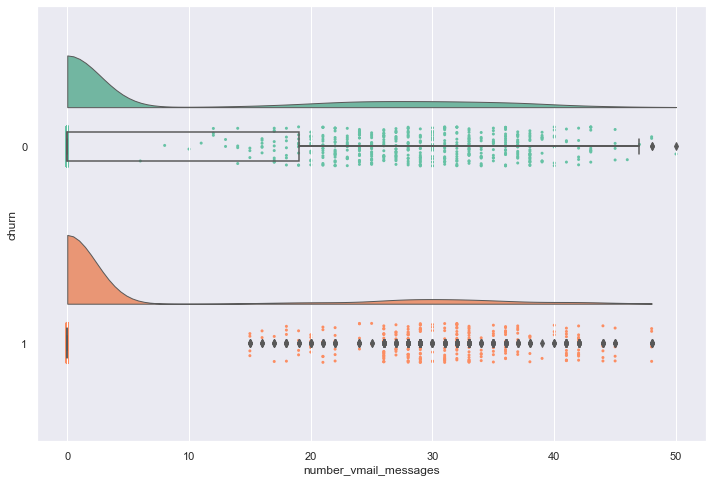

In [59]:
plt.figure(figsize = (12,8))
ptitprince.RainCloud(data = df_sample, x = 'churn', y = 'number_vmail_messages', orient = 'h')

<AxesSubplot:xlabel='number_customer_service_calls', ylabel='churn'>

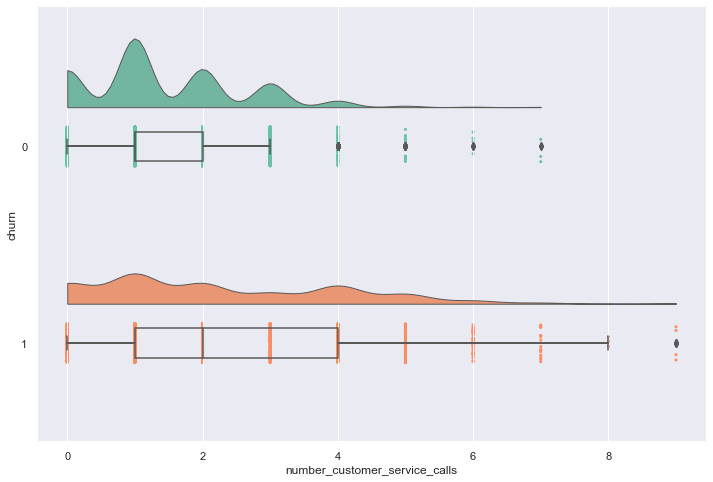

In [60]:
plt.figure(figsize = (12,8))
ptitprince.RainCloud(data = df_sample, x = 'churn', y = 'number_customer_service_calls', orient = 'h')

<AxesSubplot:xlabel='account_length', ylabel='churn'>

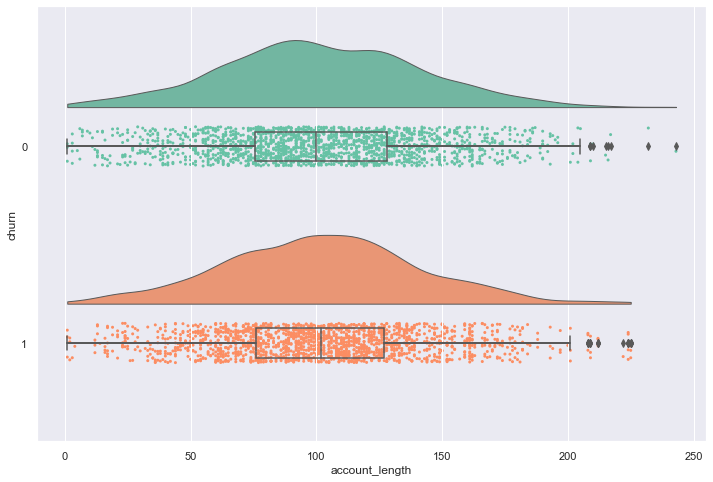

In [61]:
plt.figure(figsize = (12,8))
ptitprince.RainCloud(data = df_sample, x = 'churn', y = 'account_length', orient = 'h')

<AxesSubplot:xlabel='area_code', ylabel='churn'>

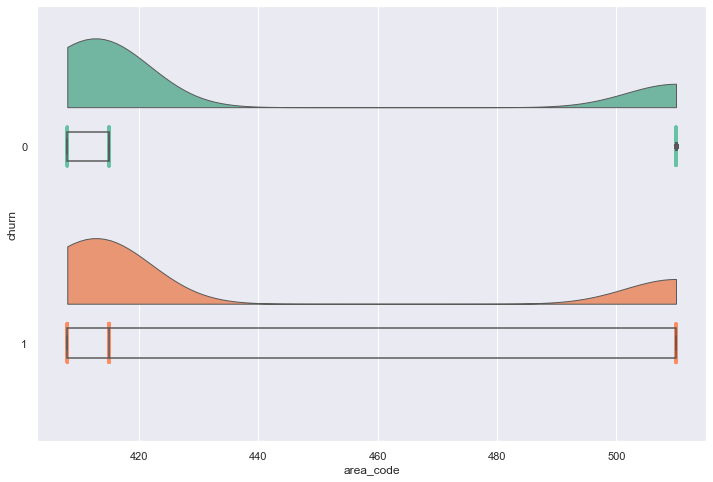

In [62]:
plt.figure(figsize = (12,8))
ptitprince.RainCloud(data = df_sample, x = 'churn', y = 'area_code', orient = 'h')

# Features Engineering

In [63]:
features_one_hot = df_sample
features_one_hot = pd.concat([features_one_hot, pd.get_dummies(df_sample['state'])], axis=1) #get dummies of column 'state'
features_one_hot.drop(['state'], axis=1, inplace=True) #drop 'state' column
features_one_hot = features_one_hot.astype(float) # convert features to a float


In [64]:
# Categorical features 
features_categorical = ['area_code', 'international_plan', 'voice_mail_plan', 'number_customer_service_calls',
                        'KY', 'NV', 'CA', 'RI', 'CO', 'MD', 'MO', 'ND', 'WA', 'MI', 'OK', 'MN', 'NE', 'UT',
                        'CT', 'WI', 'FL', 'OR', 'IL', 'ME', 'NY', 'NJ', 'TX', 'ID', 'MS', 'AR', 'SD', 'DC',
                        'NM', 'OH', 'AK', 'AL', 'NC', 'LA', 'MA', 'AZ', 'WV', 'PA', 'VT', 'DE', 'SC', 'NH',
                        'MT', 'IA', 'HI', 'IN', 'GA', 'KS', 'TN', 'VA', 'WY']
# Numerical features
features_numerical = ['account_length', 'number_vmail_messages', 'total_day_minutes',
                      'total_day_calls', 'total_day_charge', 'total_eve_minutes', 'total_eve_calls',
                      'total_eve_charge', 'total_night_minutes', 'total_night_calls', 'total_night_charge',
                      'total_intl_minutes', 'total_intl_calls', 'total_intl_charge']

In [65]:
# Feature Importance 
global_mean = features_one_hot.churn.mean() #find the global_mean

for col in features_categorical:
    df_group = features_one_hot.groupby(by=col).churn.agg(['mean'])
    df_group['diff'] = df_group['mean'] - global_mean
    df_group['risk'] = df_group['mean'] / global_mean
    display(df_group)

,mean,diff,risk
area_code,,,
408.0,0.485263,-0.014737,0.970526
415.0,0.497482,-0.002518,0.994964
510.0,0.520352,0.020352,1.040704


,mean,diff,risk
international_plan,,,
0.0,0.434667,-0.065333,0.869333
1.0,0.803406,0.303406,1.606811


,mean,diff,risk
voice_mail_plan,,,
0.0,0.536278,0.036278,1.072555
1.0,0.369483,-0.130517,0.738966


,mean,diff,risk
number_customer_service_calls,,,
0.0,0.460452,-0.039548,0.920904
1.0,0.401853,-0.098147,0.803707
2.0,0.450488,-0.049512,0.900976
3.0,0.410501,-0.089499,0.821002
4.0,0.811798,0.311798,1.623596
5.0,0.912281,0.412281,1.824561
6.0,0.912281,0.412281,1.824561
7.0,0.857143,0.357143,1.714286
8.0,1.000000,0.500000,2.000000


,mean,diff,risk
KY,,,
0.0,0.500420,0.000420,1.000839
1.0,0.478873,-0.021127,0.957746


,mean,diff,risk
NV,,,
0.0,0.496774,-0.003226,0.993548
1.0,0.641975,0.141975,1.283951


,mean,diff,risk
CA,,,
0.0,0.497081,-0.002919,0.994162
1.0,0.714286,0.214286,1.428571


,mean,diff,risk
RI,,,
0.0,0.502648,0.002648,1.005297
1.0,0.338983,-0.161017,0.677966


,mean,diff,risk
CO,,,
0.0,0.499163,-0.000837,0.998326
1.0,0.548387,0.048387,1.096774


,mean,diff,risk
MD,,,
0.0,0.494944,-0.005056,0.989888
1.0,0.709302,0.209302,1.418605


,mean,diff,risk
MO,,,
0.0,0.500699,0.000699,1.001397
1.0,0.462687,-0.037313,0.925373


,mean,diff,risk
ND,,,
0.0,0.502651,0.002651,1.005303
1.0,0.349206,-0.150794,0.698413


,mean,diff,risk
WA,,,
0.0,0.497472,-0.002528,0.994944
1.0,0.604651,0.104651,1.209302


,mean,diff,risk
MI,,,
0.0,0.498451,-0.001549,0.996902
1.0,0.557895,0.057895,1.115789


,mean,diff,risk
OK,,,
0.0,0.500981,0.000981,1.001962
1.0,0.455696,-0.044304,0.911392


,mean,diff,risk
MN,,,
0.0,0.498873,-0.001127,0.997745
1.0,0.540816,0.040816,1.081633


,mean,diff,risk
NE,,,
0.0,0.501668,0.001668,1.003335
1.0,0.375000,-0.125000,0.750000


,mean,diff,risk
UT,,,
0.0,0.499720,-0.000280,0.999439
1.0,0.512821,0.012821,1.025641


,mean,diff,risk
CT,,,
0.0,0.500421,0.000421,1.000843
1.0,0.482759,-0.017241,0.965517


,mean,diff,risk
WI,,,
0.0,0.502937,0.002937,1.005874
1.0,0.352113,-0.147887,0.704225


,mean,diff,risk
FL,,,
0.0,0.499582,-0.000418,0.999163
1.0,0.524590,0.024590,1.049180


,mean,diff,risk
OR,,,
0.0,0.500844,0.000844,1.001687
1.0,0.466667,-0.033333,0.933333


,mean,diff,risk
IL,,,
0.0,0.502506,0.002506,1.005011
1.0,0.333333,-0.166667,0.666667


,mean,diff,risk
ME,,,
0.0,0.498173,-0.001827,0.996345
1.0,0.573034,0.073034,1.146067


,mean,diff,risk
NY,,,
0.0,0.499435,-0.000565,0.998871
1.0,0.519231,0.019231,1.038462


,mean,diff,risk
NJ,,,
0.0,0.494636,-0.005364,0.989272
1.0,0.682692,0.182692,1.365385


,mean,diff,risk
TX,,,
0.0,0.495348,-0.004652,0.990696
1.0,0.666667,0.166667,1.333333


,mean,diff,risk
ID,,,
0.0,0.500560,0.000560,1.001119
1.0,0.472222,-0.027778,0.944444


,mean,diff,risk
MS,,,
0.0,0.498174,-0.001826,0.996347
1.0,0.574713,0.074713,1.149425


,mean,diff,risk
AR,,,
0.0,0.499300,-0.000700,0.998601
1.0,0.534247,0.034247,1.068493


,mean,diff,risk
SD,,,
0.0,0.498054,-0.001946,0.996109
1.0,0.645833,0.145833,1.291667


,mean,diff,risk
DC,,,
0.0,0.502090,0.002090,1.004179
1.0,0.368421,-0.131579,0.736842


,mean,diff,risk
NM,,,
0.0,0.501254,0.001254,1.002508
1.0,0.421053,-0.078947,0.842105


,mean,diff,risk
OH,,,
0.0,0.501264,0.001264,1.002529
1.0,0.448276,-0.051724,0.896552


,mean,diff,risk
AK,,,
0.0,0.502359,0.002359,1.004718
1.0,0.302326,-0.197674,0.604651


,mean,diff,risk
AL,,,
0.0,0.50126,0.00126,1.00252
1.0,0.44000,-0.06000,0.88000


,mean,diff,risk
NC,,,
0.0,0.499441,-0.000559,0.998883
1.0,0.530303,0.030303,1.060606


,mean,diff,risk
LA,,,
0.0,0.501249,0.001249,1.002498
1.0,0.395349,-0.104651,0.790698


,mean,diff,risk
MA,,,
0.0,0.498319,-0.001681,0.996639
1.0,0.578947,0.078947,1.157895


,mean,diff,risk
AZ,,,
0.0,0.504190,0.004190,1.008380
1.0,0.272727,-0.227273,0.545455


,mean,diff,risk
WV,,,
0.0,0.501411,0.001411,1.002822
1.0,0.450980,-0.049020,0.901961


,mean,diff,risk
PA,,,
0.0,0.500139,0.000139,1.000278
1.0,0.490196,-0.009804,0.980392


,mean,diff,risk
VT,,,
0.0,0.502522,0.002522,1.005045
1.0,0.384615,-0.115385,0.769231


,mean,diff,risk
DE,,,
0.0,0.499860,-0.000140,0.999720
1.0,0.506849,0.006849,1.013699


,mean,diff,risk
SC,,,
0.0,0.497620,-0.002380,0.995239
1.0,0.613333,0.113333,1.226667


,mean,diff,risk
NH,,,
0.0,0.5,0.0,1.0
1.0,0.5,0.0,1.0


,mean,diff,risk
MT,,,
0.0,0.497193,-0.002807,0.994385
1.0,0.619048,0.119048,1.238095


,mean,diff,risk
IA,,,
0.0,0.502360,0.002360,1.004721
1.0,0.311111,-0.188889,0.622222


,mean,diff,risk
HI,,,
0.0,0.503194,0.003194,1.006387
1.0,0.244444,-0.255556,0.488889


,mean,diff,risk
IN,,,
0.0,0.500280,0.000280,1.000560
1.0,0.486486,-0.013514,0.972973


,mean,diff,risk
GA,,,
0.0,0.498748,-0.001252,0.997495
1.0,0.584906,0.084906,1.169811


,mean,diff,risk
KS,,,
0.0,0.498175,-0.001825,0.996349
1.0,0.576471,0.076471,1.152941


,mean,diff,risk
TN,,,
0.0,0.5,0.0,1.0
1.0,0.5,0.0,1.0


,mean,diff,risk
VA,,,
0.0,0.503770,0.003770,1.007540
1.0,0.292308,-0.207692,0.584615


,mean,diff,risk
WY,,,
0.0,0.501541,0.001541,1.003082
1.0,0.428571,-0.071429,0.857143


In [66]:
def calculate_mi(series):
    return mutual_info_score(series, features_one_hot.churn) # returns the mutual info score value

df_mi = features_one_hot[features_categorical].apply(calculate_mi) # calc the value of mi
df_mi = df_mi.sort_values(ascending=False).to_frame(name='MI') # sort in ascending


display(df_mi.head())
display(df_mi.tail())

,MI
number_customer_service_calls,0.058487
international_plan,0.042038
voice_mail_plan,0.009558
MD,0.002182
NJ,0.002005


,MI
UT,7.187157e-06
PA,2.727272e-06
DE,1.917024e-06
NH,8.881784e-16
TN,8.881784e-16


In [67]:
features_one_hot[features_numerical].corrwith(features_one_hot.churn).to_frame('correlation')

,correlation
account_length,0.008272
number_vmail_messages,-0.116221
total_day_minutes,0.259333
total_day_calls,0.017045
total_day_charge,0.259324
total_eve_minutes,0.151818
total_eve_calls,-0.010448
total_eve_charge,0.151806
total_night_minutes,0.051088
total_night_calls,0.005506


In [68]:
features_one_hot.groupby(by='churn')[features_numerical].mean()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge
churn,,,,,,,,,,,,,,
0.0,101.749863,7.944048,175.087438,100.426221,29.765518,196.368897,100.699945,16.691596,200.287987,99.862315,9.013072,10.194624,4.453099,2.753094
1.0,102.402633,4.981898,207.561602,101.134394,35.285952,212.148546,100.284696,18.032737,205.387329,100.081733,9.242534,10.709984,4.179375,2.892244


In [69]:
df_sample_train_full = features_one_hot 
X = df_sample_train_full.drop("churn",  axis=1)
y = df_sample_train_full["churn"]

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

## Feature Scaling

In [71]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_train

array([[-0.02025284, -0.05826104, -0.50808666, ..., -0.13855925,
        -0.18043874, -0.14159847],
       [-0.02025286,  2.19448567, -0.50808666, ..., -0.13855925,
        -0.18043874, -0.14159847],
       [-0.02025242,  0.04186103, -0.67518108, ..., -0.13855925,
        -0.18043874, -0.14159847],
       ...,
       [-0.02025243,  2.69509605, -0.67518108, ..., -0.13855925,
        -0.18043874, -0.14159847],
       [-0.02025286, -2.03567205,  1.75962323, ..., -0.13855925,
        -0.18043874, -0.14159847],
       [-0.02025248,  1.79399736,  1.75962323, ..., -0.13855925,
        -0.18043874, -0.14159847]])

In [72]:
X_test = scaler.fit_transform(X_test)
X_test

array([[-0.03636477,  0.24549771, -0.53633875, ..., -0.14561734,
        -0.14561734, -0.1571014 ],
       [-0.03720578, -0.40509933,  1.67617707, ..., -0.14561734,
        -0.14561734, -0.1571014 ],
       [-0.0378532 , -1.08172025, -0.53633875, ..., -0.14561734,
        -0.14561734, -0.1571014 ],
       ...,
       [-0.03796944, -1.13376801,  1.67617707, ..., -0.14561734,
        -0.14561734, -0.1571014 ],
       [-0.03766728, -0.24895604, -0.69936623, ..., -0.14561734,
        -0.14561734, -0.1571014 ],
       [-0.03766253,  0.24549771, -0.69936623, ..., -0.14561734,
        -0.14561734, -0.1571014 ]])

## Decision Tree 

              precision    recall  f1-score   support

         0.0       0.79      0.90      0.84       599
         1.0       0.89      0.77      0.82       605

    accuracy                           0.83      1204
   macro avg       0.84      0.83      0.83      1204
weighted avg       0.84      0.83      0.83      1204



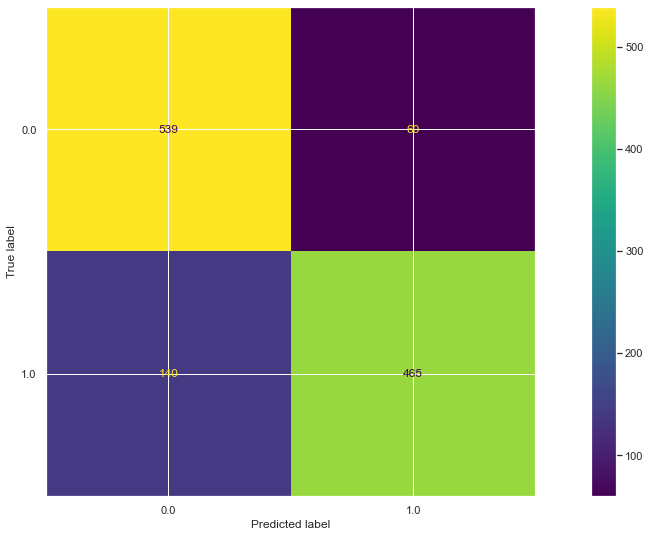

In [73]:
clfd = DecisionTreeClassifier(random_state=0, max_depth=4, min_samples_split=10)
clfd.fit(X_train, y_train)

pd = clfd.predict(X_test)
print(classification_report(y_test, pd))
plot_confusion_matrix(clfd, X_test, y_test)

## Random Forest

              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       599
         1.0       0.96      0.97      0.96       605

    accuracy                           0.96      1204
   macro avg       0.96      0.96      0.96      1204
weighted avg       0.96      0.96      0.96      1204



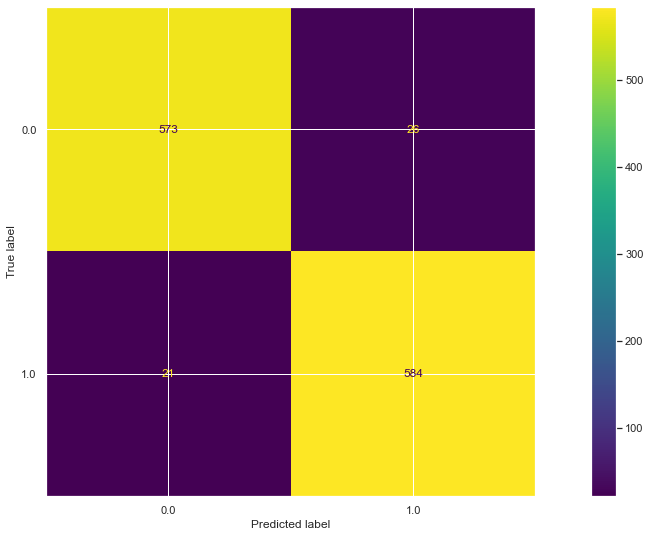

In [74]:
clfr = RandomForestClassifier(n_estimators=100, random_state=0)
clfr.fit(X_train, y_train)

pr = clfr.predict(X_test)
print(classification_report(y_test, pr))
plot_confusion_matrix(clfr, X_test, y_test)  

## Gradient Boosting

              precision    recall  f1-score   support

         0.0       0.86      0.90      0.88       599
         1.0       0.90      0.86      0.88       605

    accuracy                           0.88      1204
   macro avg       0.88      0.88      0.88      1204
weighted avg       0.88      0.88      0.88      1204



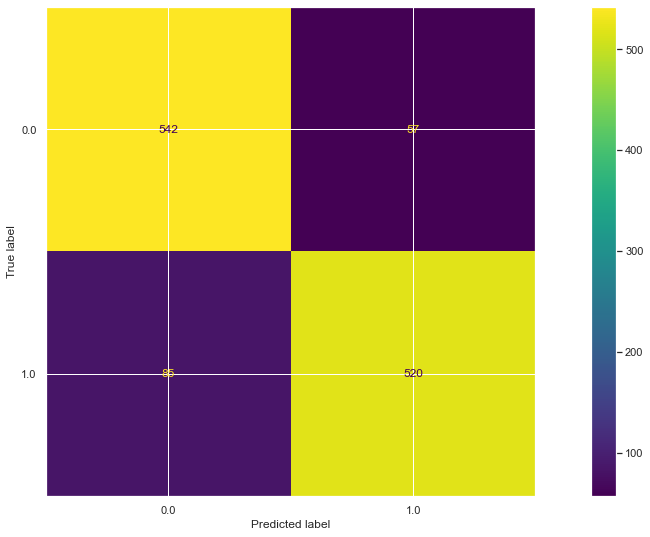

In [75]:
clfg = GradientBoostingClassifier(n_estimators=200, max_depth=2, random_state=0)
clfg.fit(X_train, y_train)

pg = clfg.predict(X_test)
print(classification_report(y_test, pg))
plot_confusion_matrix(clfg, X_test, y_test) 

## KNN

              precision    recall  f1-score   support

         0.0       0.87      0.77      0.82       599
         1.0       0.79      0.89      0.84       605

    accuracy                           0.83      1204
   macro avg       0.83      0.83      0.83      1204
weighted avg       0.83      0.83      0.83      1204



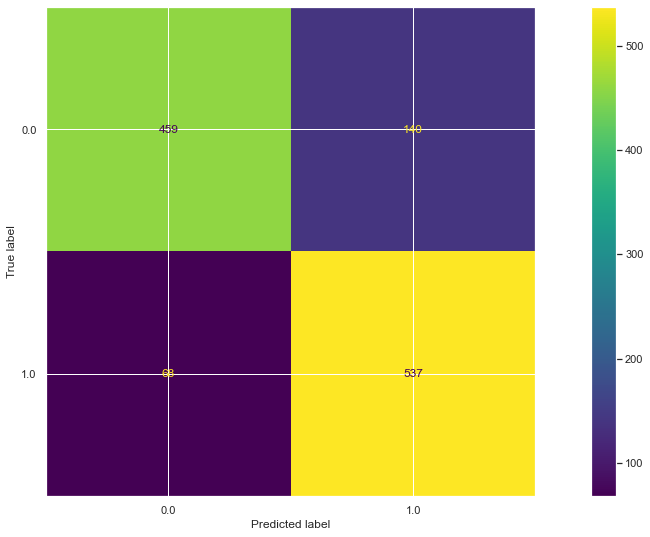

In [76]:
clfk = KNeighborsClassifier(n_neighbors=5, weights='distance')
clfk.fit(X_train, y_train)

pk = clfk.predict(X_test)
print(classification_report(y_test, pk))
plot_confusion_matrix(clfk, X_test, y_test) 

## AUC ROC

In [77]:
p1 = clfd.predict_proba(X_test)
p2 = clfr.predict_proba(X_test)
p3 = clfg.predict_proba(X_test)
p4 = clfk.predict_proba(X_test)

In [78]:
# auc scores
auc_score1 = roc_auc_score(y_test, p1[:,1])
auc_score2 = roc_auc_score(y_test, p2[:,1])
auc_score3 = roc_auc_score(y_test, p3[:,1])
auc_score4 = roc_auc_score(y_test, p4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

0.8849694394238331 0.9840022627243753 0.9400612591233323 0.9052180631631233


In [79]:
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, p1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, p2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, p3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, p4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

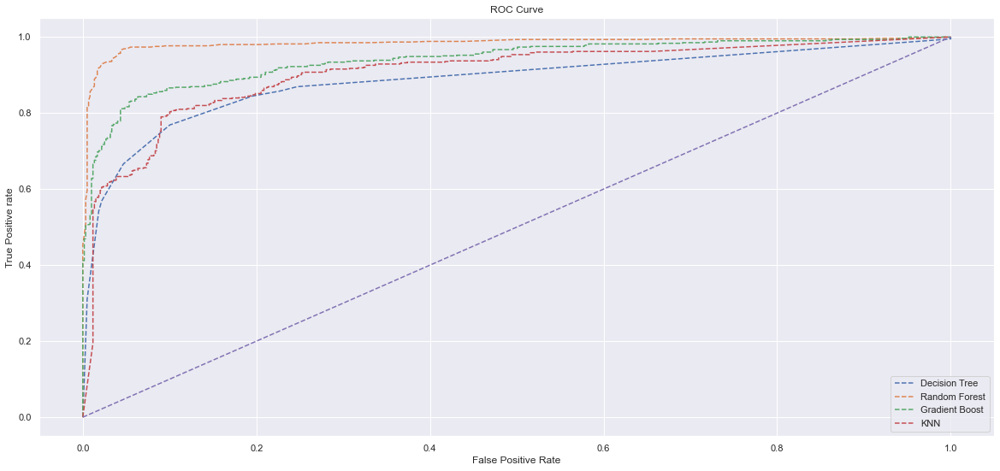

In [80]:
plt.plot(fpr1, tpr1, linestyle='--', label='Decision Tree')
plt.plot(fpr2, tpr2, linestyle='--', label='Random Forest')
plt.plot(fpr3, tpr3, linestyle='--', label='Gradient Boost')
plt.plot(fpr4, tpr4, linestyle='--', label='KNN')
plt.plot(p_fpr, p_tpr, linestyle='--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')

# Conclusion
## Steps to Retain Customers
* More Customer Service calls mean the customer is more likely to be retained.
* Optimize the price of talk time for segment 1 customers.
* Introduce a data plan to those customers who are using data without data plans ASAP.
* Introduce exciting data plans to segment 1 customers.
* Optimization of price of data plans can retain segment 2 customers also.


## Machine Learning Models
* Random Forest is the best.

## Final Model

In [81]:
# Final Model
X, y =  df_sample_train_full.drop(['churn'], axis=1), df_sample_train_full.churn
model = RandomForestClassifier(n_estimators=100, random_state=0)
model.fit(X, y)

RandomForestClassifier(random_state=0)

In [82]:
# exporting final model with joblib
joblib.dump(model, 'model.sav')

['model.sav']